In [ ]:
!pip -q install git+https://github.com/huggingface/transformers # need to install from github
!pip -q install bitsandbytes accelerate xformers einops
!pip -q install flash_attn
!pip -q install hf_transfer

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.8/119.8 MB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.6/302.6 kB 26.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.7/222.7 MB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 74.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 38.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 45.5 MB/s eta 0:00:00


In [ ]:
from IPython.display import Markdown, display

display(Markdown("## Phi-3-Vision"))

## Phi-3-Vision

In [ ]:
import os
import torch
import transformers
from PIL import Image
import requests
from transformers import AutoProcessor, AutoModelForCausalLM

os.environ ['HF_HUB_ENABLE_HF_TRANSFER'] = '1'

In [ ]:

model_id = "microsoft/Phi-3-vision-128k-instruct"

model = AutoModelForCausalLM.from_pretrained(model_id, device_map="cuda",
                                             trust_remote_code=True,
                                             torch_dtype="auto")

processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

config.json:   0%|          | 0.00/3.66k [00:00<?, ?B/s]

configuration_phi3_v.py:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- configuration_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_phi3_v.py:   0%|          | 0.00/75.4k [00:00<?, ?B/s]

image_embedding_phi3_v.py:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- image_embedding_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- modeling_phi3_v.py
- image_embedding_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.safetensors.index.json:   0%|          | 0.00/68.9k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.94G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/3.35G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/464 [00:00<?, ?B/s]

processing_phi3_v.py:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

image_processing_phi3_v.py:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- image_processing_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/microsoft/Phi-3-vision-128k-instruct:
- processing_phi3_v.py
- image_processing_phi3_v.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/9.40k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.85M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/670 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
!nvidia-smi

Fri Jun  7 02:04:29 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   36C    P0              27W /  72W |   8103MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Prompt format

```
<|user|>\n<|image_1|>\n{prompt_1}<|end|>\n<|assistant|>\n{response_1}<|end|>\n<|user|>\n{prompt_2}<|end|>\n<|assistant|>\n
```

In [ ]:
### Getting the image
url = "https://assets-c4akfrf5b4d3f4b7.z01.azurefd.net/assets/2024/04/BMDataViz_661fb89f3845e.png"

image = Image.open(requests.get(url, stream=True).raw)

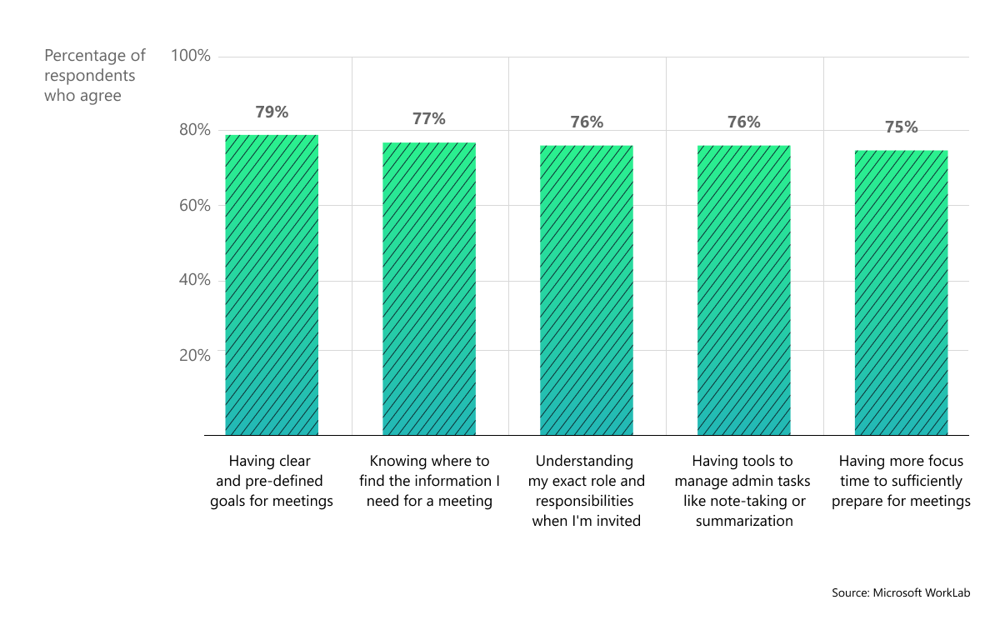

In [ ]:
image

In [ ]:
messages = [
    {"role": "user", "content": "<|image_1|>\nWhat is shown in this image?"},
    {"role": "assistant", "content": "The chart displays the percentage of respondents who agree with various statements about their preparedness for meetings. It shows five categories: 'Having clear and pre-defined goals for meetings', 'Knowing where to find the information I need for a meeting', 'Understanding my exact role and responsibilities when I'm invited', 'Having tools to manage admin tasks like note-taking or summarization', and 'Having more focus time to sufficiently prepare for meetings'. Each category has an associated bar indicating the level of agreement, measured on a scale from 0% to 100%."},
    {"role": "user", "content": "Provide insightful questions to spark discussion."}
]



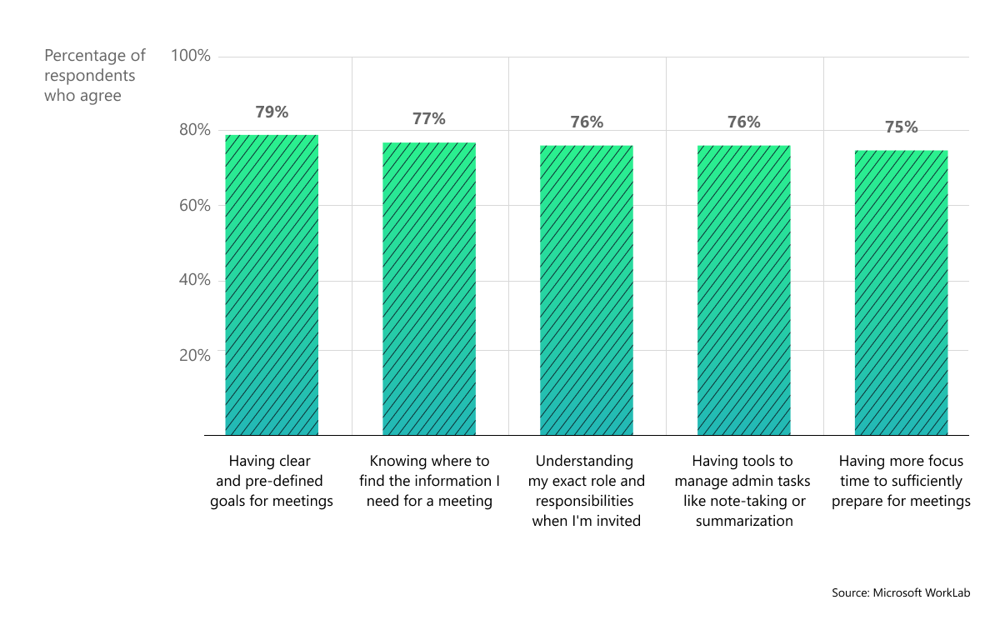

In [ ]:
image

In [ ]:
prompt = processor.tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

inputs = processor(prompt, [image], return_tensors="pt").to("cuda:0")

In [ ]:
generation_args = {
    "max_new_tokens": 512,
    "do_sample": False,
    # "temperature": 0.0,

}

In [ ]:
generate_ids = model.generate(**inputs, eos_token_id=processor.tokenizer.eos_token_id, **generation_args)

# remove input tokens
generate_ids = generate_ids[:, inputs['input_ids'].shape[1]:]
response = processor.batch_decode(generate_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]

print(response)

The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.


1. What are the most significant barriers to meeting preparedness according to the respondents?
2. How does the level of agreement with each statement correlate with the respondents' overall satisfaction with their meetings?
3. Are there any notable differences in agreement levels between different demographics or job roles?
4. What strategies have been most effective in helping respondents prepare for meetings, based on their feedback?
5. How might organizations use this data to improve meeting outcomes and participant engagement?


In [ ]:
def vqa_phi3(image, prompt):
    messages = [
        {"role": "user", "content": f"<|image_1|>\n{prompt}"},
    ]
    prompt = processor.tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

    inputs = processor(prompt, [image], return_tensors="pt").to("cuda:0")

    generate_ids = model.generate(**inputs, eos_token_id=processor.tokenizer.eos_token_id, **generation_args)

    # remove input tokens
    generate_ids = generate_ids[:, inputs['input_ids'].shape[1]:]
    response = processor.batch_decode(generate_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]

    print(response)



In [ ]:
img_url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/bee.JPG?download=true"
image = Image.open(requests.get(img_url, stream=True).raw)
image

In [ ]:
prompt = "What is shown in this image?"

vqa_phi3(image, prompt)

The image displays a variety of flowers, including a large pink flower with a bee on it, and several smaller flowers in the background.


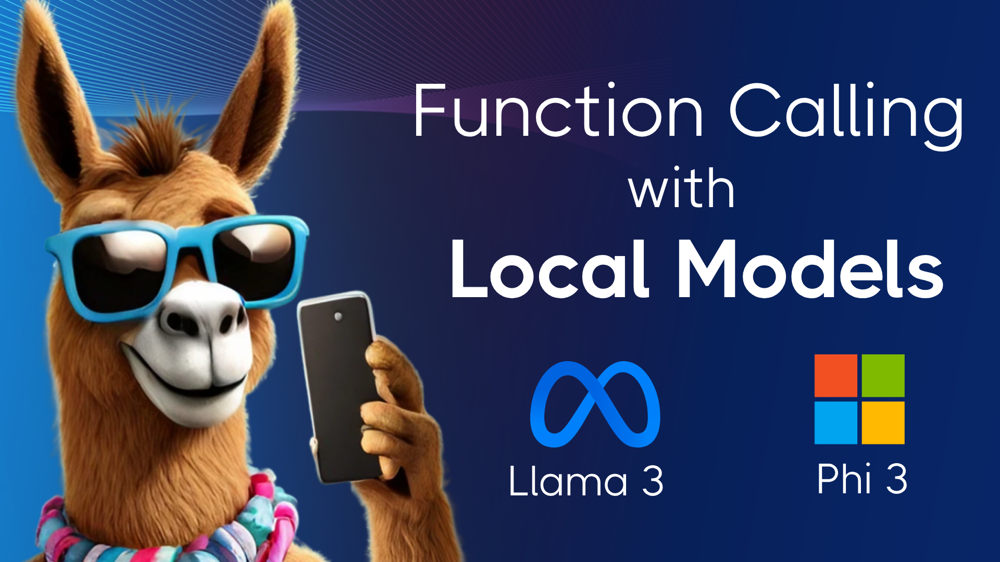

In [ ]:
img_path = "/content/YT-cover-vid3f-llama3-function-calling-langchain-phi3-final2.png"

image = Image.open(img_path).convert("RGB")
image

In [ ]:
prompt = "What is shown in this image?"

vqa_phi3(image, prompt)

The image shows a llama wearing sunglasses and a scarf, holding a smartphone. There are also logos for Llama 3 and Phi 3, and text that reads 'Function Calling with Local Models'.


In [ ]:
prompt = "What color are the sunglasses?"

vqa_phi3(image, prompt)

The sunglasses are blue.


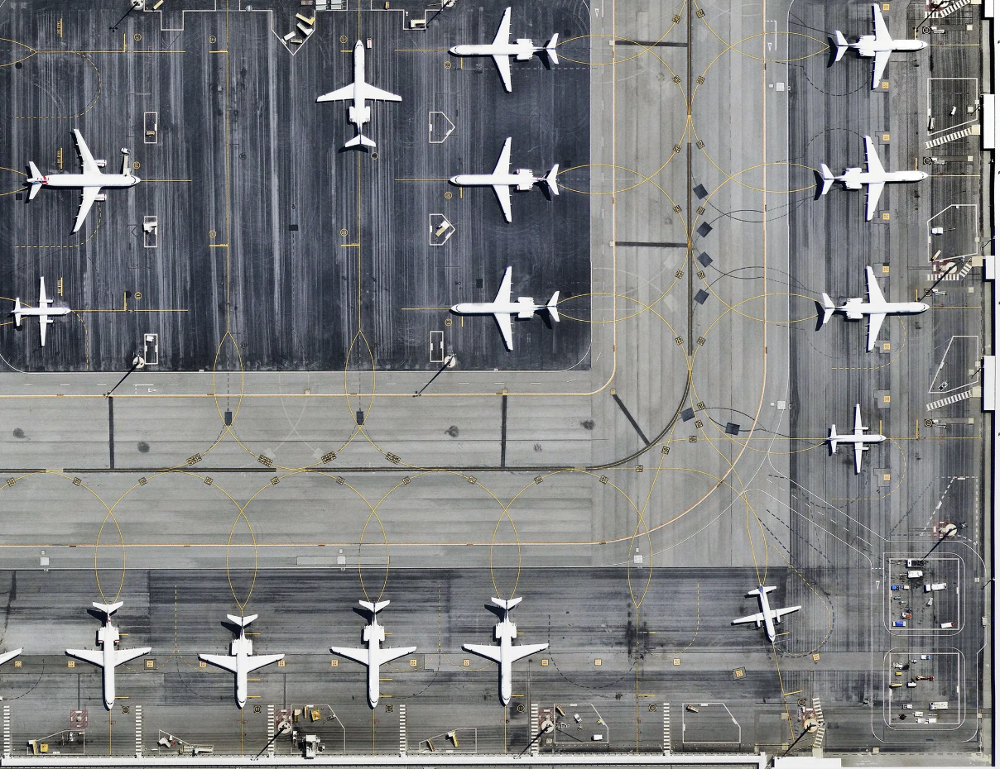

In [ ]:
img_path = "/content/planes.png"

image = Image.open(img_path).convert("RGB")
image

In [ ]:
prompt = "What is shown in this image?"

vqa_phi3(image, prompt)

The image shows an aerial view of an airport runway with multiple airplanes parked.


In [ ]:
prompt = "How many planes are there?"

vqa_phi3(image, prompt)

There are 12 planes visible in the image.


In [ ]:
prompt = "Give me the bounding boxes for the planes"

vqa_phi3(image, prompt)

Providing bounding boxes for objects in an image is beyond my capabilities as I am not equipped to perform object detection or provide spatial coordinates.


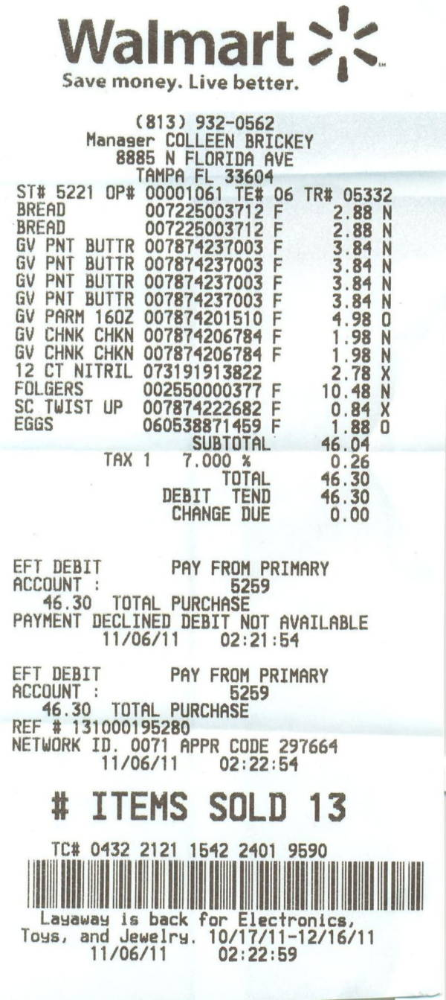

In [ ]:
img_path = "/content/receipt.jpeg"

image = Image.open(img_path).convert("RGB")
image

In [ ]:
prompt = "What is this?"

vqa_phi3(image, prompt)

This is a Walmart receipt.


In [ ]:
prompt = "How much is the bread?"

vqa_phi3(image, prompt)

The bread is priced at 2.88 N.


In [ ]:
prompt = "What cost 1.88?"

vqa_phi3(image, prompt)

The cost of 1.88 is for the 'EGGS' item.


In [ ]:
prompt = "How much is. the peanut butter?"

vqa_phi3(image, prompt)

The price of the peanut butter is 3.84 N.


In [ ]:
prompt = "How many peanut butters did I buy??"

vqa_phi3(image, prompt)

You bought 3 peanut butters.


## Lets try 4bit

In [ ]:
import os
import torch
import transformers
from PIL import Image
import requests
from transformers import AutoProcessor, AutoModelForCausalLM

os.environ ['HF_HUB_ENABLE_HF_TRANSFER'] = '1'

In [ ]:
from transformers import BitsAndBytesConfig
bnb_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_quant_type="nf4",
        bnb_4bit_compute_type=torch.bfloat16
)


model_id = "microsoft/Phi-3-vision-128k-instruct"

model = AutoModelForCausalLM.from_pretrained(model_id, device_map="cuda",
                                             quantization_config=bnb_config,
                                             trust_remote_code=True,
                                             torch_dtype="auto")

processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

Unused kwargs: ['bnb_4bit_compute_type']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
!nvidia-smi

Fri Jun  7 02:36:59 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   63C    P0              31W /  72W |   2749MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
def vqa_phi3(image, prompt):
    generation_args = {
        "max_new_tokens": 512,
        "do_sample": False,
        # "temperature": 0.0,

    }
    messages = [
        {"role": "user", "content": f"<|image_1|>\n{prompt}"},
    ]
    prompt = processor.tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

    inputs = processor(prompt, [image], return_tensors="pt").to("cuda:0")

    generate_ids = model.generate(**inputs, eos_token_id=processor.tokenizer.eos_token_id, **generation_args)

    # remove input tokens
    generate_ids = generate_ids[:, inputs['input_ids'].shape[1]:]
    response = processor.batch_decode(generate_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]

    print(response)



In [ ]:
img_url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/bee.JPG?download=true"
image = Image.open(requests.get(img_url, stream=True).raw)
image

In [ ]:
prompt = "What is shown in this image?"

vqa_phi3(image, prompt)

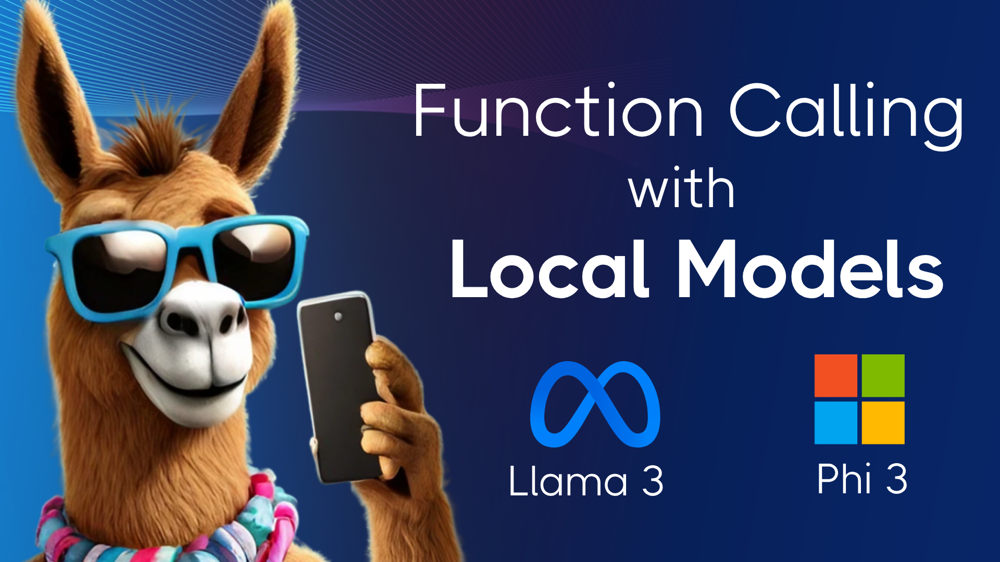

In [ ]:
img_path = "/content/YT-cover-vid3f-llama3-function-calling-langchain-phi3-final2.png"

image = Image.open(img_path).convert("RGB")
image

In [ ]:
prompt = "What is shown in this image?"

vqa_phi3(image, prompt)

The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.


The image displays a graphic with text and logos related to function calling with local models, specifically mentioning 'Llama 3' and 'Phi 3'. There is also a graphic of a llama wearing sunglasses and holding a smartphone.


In [ ]:
prompt = "What color are the sunglasses?"

vqa_phi3(image, prompt)

The sunglasses are blue.


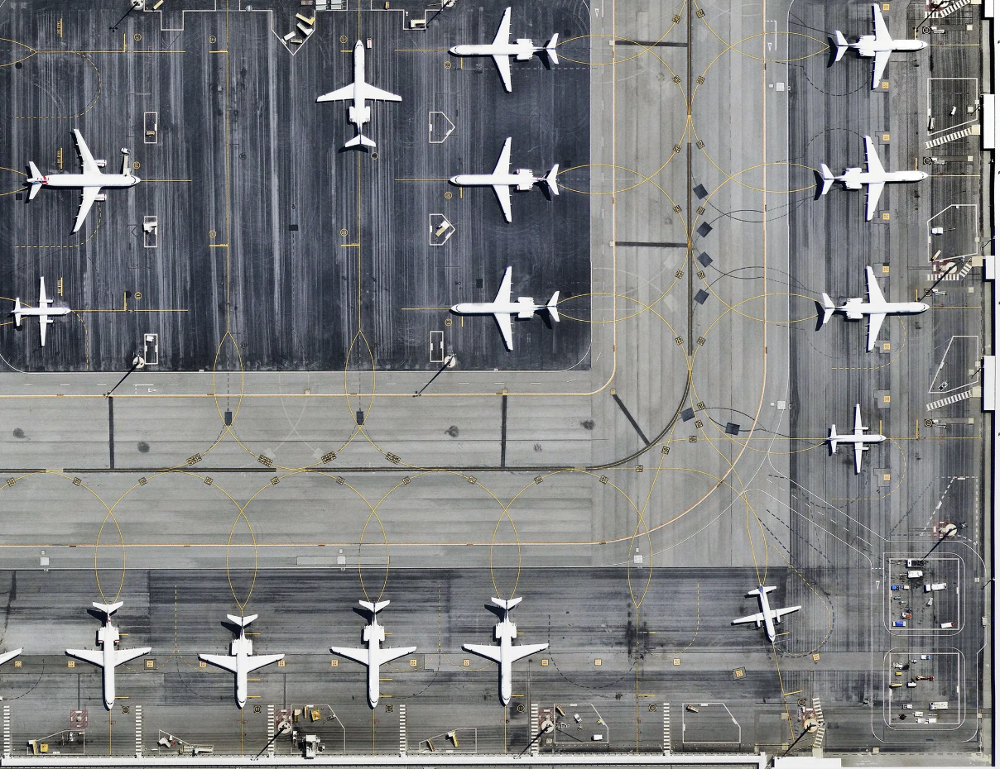

In [ ]:
img_path = "/content/planes.png"

image = Image.open(img_path).convert("RGB")
image

In [ ]:
prompt = "What is shown in this image?"

vqa_phi3(image, prompt)

The image shows an aerial view of an airport runway with multiple airplanes parked on it.


In [ ]:
prompt = "How many planes are there?"

vqa_phi3(image, prompt)

There are 12 planes visible in the image.


In [ ]:
prompt = "Give me the bounding boxes for the planes"

vqa_phi3(image, prompt)

I'm sorry, but I cannot provide specific bounding box coordinates for the planes in the image.


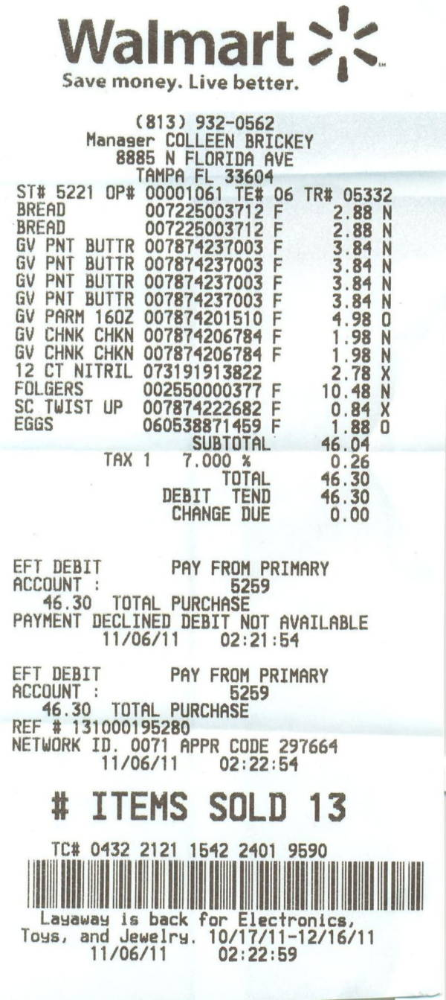

In [ ]:
img_path = "/content/receipt.jpeg"

image = Image.open(img_path).convert("RGB")
image

In [ ]:
prompt = "What is this?"

vqa_phi3(image, prompt)

This is a Walmart receipt.


In [ ]:
prompt = "How much is the bread?"

vqa_phi3(image, prompt)

The bread is priced at 2.88 N.


In [ ]:
prompt = "What cost 1.88?"

vqa_phi3(image, prompt)

The item that cost 1.88 is 'EGGS'.


In [ ]:
prompt = "How much is. the peanut butter?"

vqa_phi3(image, prompt)

The peanut butter is priced at $3.84.


In [ ]:
prompt = "How many peanut butters did I buy??"

vqa_phi3(image, prompt)

You bought 8885 peanut butters.
